# DCGAN Test on MOMA Data<a name="top"></a>

This script uses a slightly modified Keras DCGAN to generate artifical mass spectra. The MOMA ML dataset was converted to grayscale images by first scaling the relative abundance of each scan to be between [0,1] with 1 being the base peak. Next the scan was reshaped from 1D arary to a 36x36 2D array before being fed into the network.

## Setup

In [53]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [54]:
%matplotlib inline
import os
from os import makedirs
import matplotlib.pyplot as plt
import pandas as pd
import random
import seaborn as sns
sns.set(style="darkgrid")
import numpy as np
from numpy import asarray
from numpy.random import randn, randint, shuffle
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from skimage.transform import resize
from tensorflow.keras.models import load_model, model_from_json

In [3]:
# GPU Check
import tensorflow as tf 
tf.test.is_gpu_available()

True

# Prepare the Data

In [4]:
# Load dataset into pandas dataframe
full_df = pd.read_csv('full_ml_data.csv')
full_df.name = "Full Dataset"

In [5]:
# Normalize the spectral columns to be between 0 and 1, scaled by the max value in that row
# norm_spec_df = full_df.iloc[:,1:2001].apply(lambda x: x/x.max(), axis=1)
norm_spec_df = full_df.iloc[:,1:1297].apply(lambda x: x/x.max(), axis=1)

In [6]:
# Pad with zero columns if needed 
# for i in range(1,191):
#     col_name = str(1105 + i)
#     col_index = 1105 + i
#     norm_spec_df.insert(col_index,col_name,0,True)

In [7]:
sample_counts = full_df['sample_label'].value_counts()
# Top ten labels by count
sample_counts[:10]

CsI                                2814
Hematite                           2372
Au-Coated CsI                      1980
TiO2                               1884
Thin section (R-Gypsum)            1848
Yellowstone Green stream powder    1023
Atacama                             988
Thin section (Fspat1 (Ab83))        813
G24 powder                          774
Gypsum                              753
Name: sample_label, dtype: int64

In [59]:
target_name = 'CsI'

# Get all rows for the target sample label
target_rows = full_df.loc[full_df['sample_label'] == target_name].index

# Create dataframe of only target sample
target_df = norm_spec_df.iloc[target_rows]

In [10]:
# Check the range of masses
# for column in norm_spec_df.columns:
#     print('Column: ',column," sum:",norm_spec_df[column].sum())

In [57]:
# Reshape mass specs into a square
target_train = np.reshape(target_df.values,(target_df.shape[0],36,36,1))

print(f"Number of examples: {len(target_train)}")
print(f"Shape of the images in the dataset: {target_train.shape[1:]}")

Number of examples: 2814
Shape of the images in the dataset: (36, 36, 1)


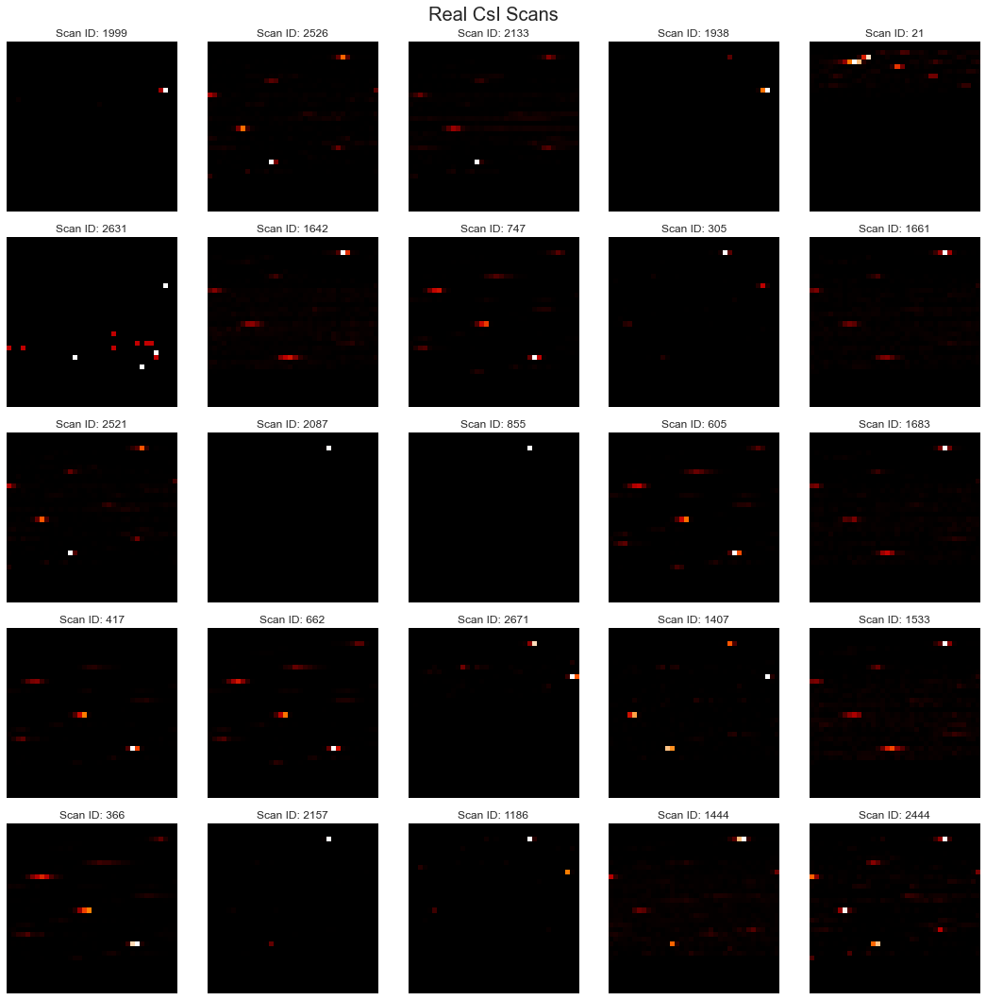

In [13]:
# Display mass spec as 36x36 image
plt.figure(1, figsize=(15, 15))
plt.suptitle('Real ' + target_name + ' Scans', fontsize=20)

k = 0
for i in random.sample(range(0,len(target_df)), 25):
    plt.subplot(5, 5, k+1)
    plt.imshow(np.array(target_df.iloc[i]).reshape(36,36),cmap='gist_heat')
    plt.axis('off')
    plt.title('Scan ID: '+str(i))
    k += 1
    
plt.tight_layout()
plt.show()

## Model

In [ ]:
import moma_dcgan

dcgan = moma_dcgan.DCGAN(36,100,1,target_name,target_df)
dcgan.train(epochs=4000, batch_size=32, save_interval=50)

<h3 align="center"><b>CsI Training Process as Mass Spectra</b></h3>


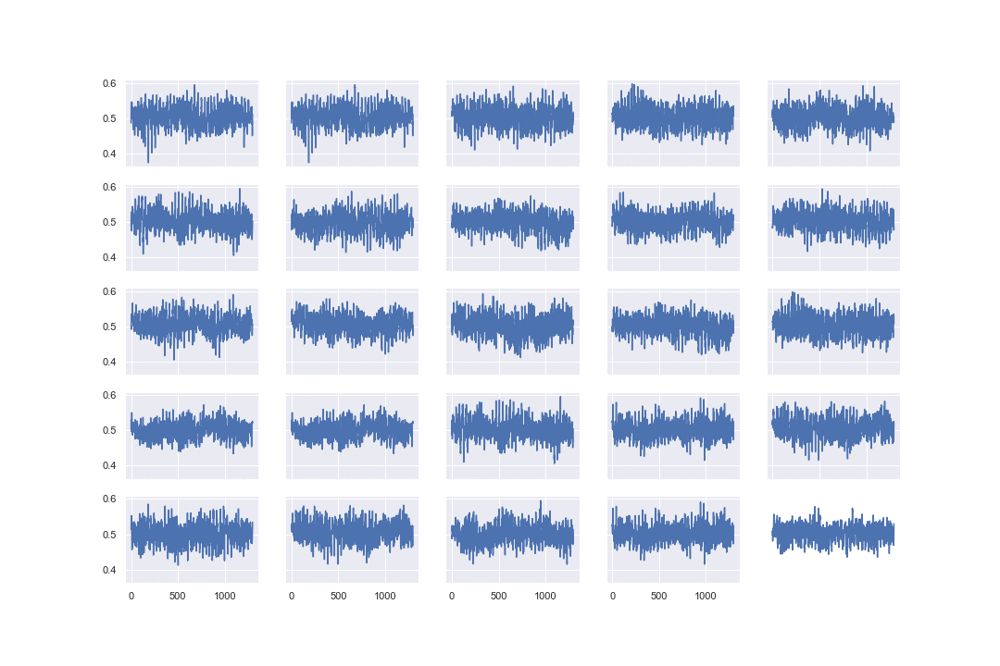

<h3 align="center"><b>Hematite Training Process as Images</b></h3>

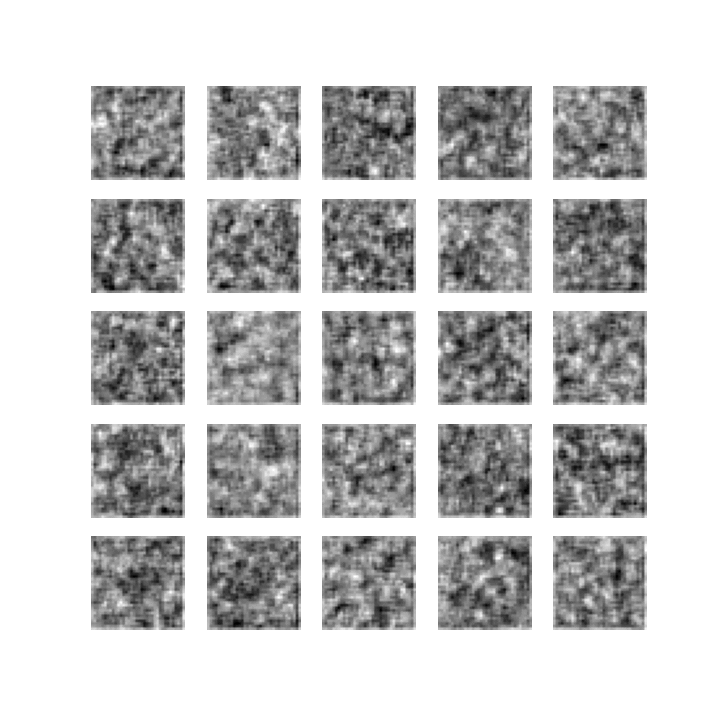

## Compare Results

In [44]:
# load json and create model
json_file = open('DCGAN/models/CsI/generator_model_3800.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
loaded_model.load_weights("DCGAN\models\CsI\generator_model_3800.h5")

In [45]:
# generate some samples
noise = np.random.normal(0, 1, (1, 100))
gen_imgs = loaded_model.predict(noise)

# rescale from [0,1]
gen_imgs = .5 * gen_imgs + .5

# Reshape back to spectrum
gen_spec = gen_imgs[0].reshape(1296)
gen_spec_df = pd.DataFrame(gen_spec.reshape(-1, len(gen_spec)))

In [46]:
# Tabulate peak data
gen_peaks = pd.DataFrame(gen_spec_df.iloc[0].nlargest(5))
gen_peaks.columns = ['Relative Abundance']
gen_peaks.insert(0,'Peak Masses',gen_peaks.index)

real_peaks = pd.DataFrame(target_df.iloc[5].nlargest(5))
real_peaks.columns = ['Relative Abundance']
real_peaks.insert(0,'Peak Masses',real_peaks.index)

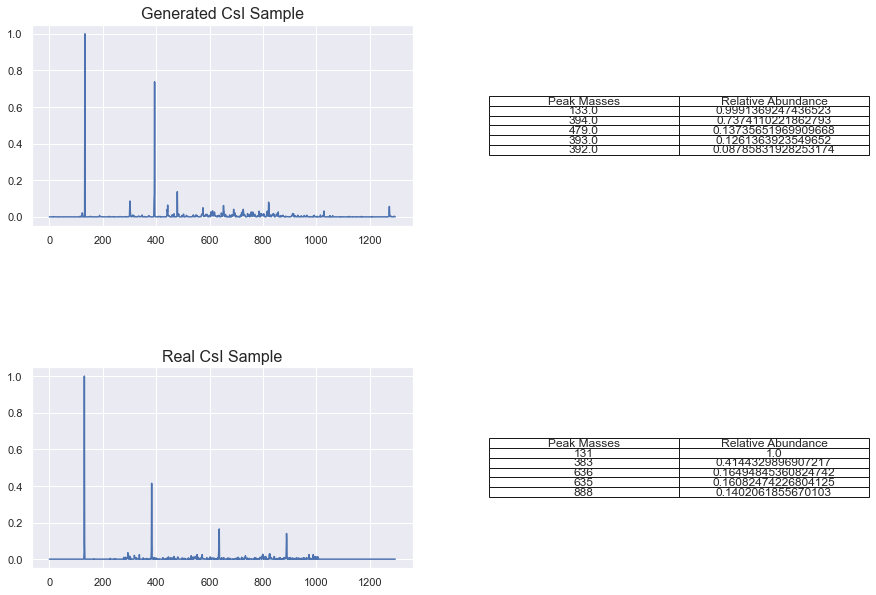

In [47]:
# Plot generated mass spectrum
f, axs = plt.subplots(2,2,figsize=(15,10))

plt.subplot(2,2,1)
gen_spec_df.iloc[0].plot(legend=None)
plt.title("Generated "+target_name+" Sample",fontsize=16)

plt.subplot(2,2,2)
cell_text1 = []
for row in range(len(gen_peaks)):
    cell_text1.append(gen_peaks.iloc[row])
plt.table(cellText=cell_text1, colLabels=gen_peaks.columns, loc='center', cellLoc='center')
plt.axis('off')

plt.subplot(2,2,3)
target_df.iloc[5].plot(legend=None)
plt.title("Real "+target_name+" Sample", fontsize=16)

plt.subplot(2,2,4)
cell_text2 = []
for row in range(len(real_peaks)):
    cell_text2.append(real_peaks.iloc[row])
plt.table(cellText=cell_text2, colLabels=real_peaks.columns, loc='center', cellLoc='center')
plt.axis('off')

f.subplots_adjust(hspace=.7)
plt.show()

The generative model emulates the four larger peaks in this particular sample. From a classification algorithm standpoint this is generally acceptable but it would not stand up to a manual inspection. Given that this sample was generated with a model used for image creation, this makes sense because recreating features as they relate to one another takes precedence over the particular location of any one feature. For example, in an image of a person wearing sunglasses the relationship of the sunglasses to the face of the person matters more than where the face exists in the image.

## Classifier Test

In [48]:
# Encode target classes
label_encoder = LabelEncoder()
y_train_cat = label_encoder.fit_transform(full_df['sample_label'])

# Map labels to encoding
target_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

In [49]:
# Somewhat subjective and random, chosen here by max predicted probabilty, all 3650
# Other evaluation options include Inception Score (IS) and Frechet Inception Distance (FID)
best_epoch = [500, 1750, 850, 250, 1150, 650, 2850]

In [68]:
# Generate and evaluate 100 samples from the list of samples
generated_results_df = pd.DataFrame(columns=['Sample Name','Predicted Name','Average Prediction Probability'])
sample_list = ['Atacama','Au-Coated CsI','CsI','Hematite','Thin section (R-Gypsum)','TiO2','Yellowstone Green stream powder']
for sample in sample_list:
    # load json and create model
    json_file = open('DCGAN/models/' + sample + '/generator_model_' + str(best_epoch[sample_list.index(sample)]) + '.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)

    # load weights into new model
    loaded_model.load_weights("DCGAN\models\/" + sample + '\generator_model_' + str(best_epoch[sample_list.index(sample)]) + '.h5')
    
    # generate 100 samples
    noise = np.random.normal(0, 1, (100, 100))
    gen_imgs = loaded_model.predict(noise)

    # rescale from [0,1]
    gen_imgs = .5 * gen_imgs + .5

    # Reshape back to spectrum
    gen_spec = gen_imgs.reshape(100,1296)
    gen_spec_df = pd.DataFrame(gen_spec)

    # Create simple model
    classifier = LogisticRegression(multi_class='multinomial', solver='lbfgs')
    classifier.fit(norm_spec_df, y_train_cat)
    
    # Find most often predicted label
    y_pred = classifier.predict(gen_spec_df)
    most_pred = np.argmax(np.bincount(y_pred))
    pred_class = [k for k,v in target_mapping.items() if v == most_pred][0]
    
    # Find average prediction probability
    y_probs = classifier.predict_proba(gen_spec_df)[:,target_mapping[sample]]
    y_avg = np.average(y_probs)
    
    generated_results_df = generated_results_df.append({"Sample Name":sample,"Predicted Name":pred_class,'Average Prediction Probability':"{0:.2%}".format(y_avg)},ignore_index=True)

In [69]:
# Add total number of samples to the results dataframe
s_counts = []
for s_name in generated_results_df['Sample Name']:
    s_counts.append(sample_counts[s_name])
generated_results_df['Sample Count'] = s_counts

# Format the results dataframe
generated_results_df.sort_values(by=['Average Prediction Probability'],ascending=False).style.hide_index().set_properties(**{'text-align': 'left'}).set_properties(subset=["Average Prediction Probability","Sample Count"], **{'text-align': 'center'}).set_table_styles([dict(selector='th', props=[('text-align', 'left')])])

Sample Name,Predicted Name,Average Prediction Probability,Sample Count
TiO2,TiO2,87.15%,1884
Yellowstone Green stream powder,Yellowstone Green stream powder,79.56%,1023
Atacama,Atacama,74.38%,988
CsI,CsI,73.36%,2814
Hematite,Hematite,67.05%,2372
Thin section (R-Gypsum),Thin section (R-Gypsum),57.13%,1848
Au-Coated CsI,CsI,41.91%,1980


Using the 'best' generator versions for each sample label, 100 new samples were generated and then passed to a simple linear classfication algorithm that had been trained on the full MOMA ML dataset. The hypothesis that samples with the largest number of observations would be most easily replicated has been demonstrated as incorrect. Atacama and Yellowstone Green stream powder contain roughly half the observations of the other samples included here yet outperformed. Presumably these samples produce a distinct pattern that is easily distinguishable when presented in this fashion, perhaps due to having fewer modes.

Further investigation is needed to determine whether the observations produced with this method would be beneficial if added to the current MOMA ML training dataset. Additionally, other flavors of GANs will be explored.

### [BACK TO TOP](#top)